RF-DETR training on dataset_v2 (train - yalour_green, additional_yalour, uk_train, validation - moot, uk_valid) + augmentation

In [1]:
from rfdetr import RFDETRMedium
import cv2
import os
import matplotlib.pyplot as plt
from pathlib import Path

In [8]:
model = RFDETRMedium(
    pretrain_weights="runs/rf_detr_v2/checkpoint_best_total.pth"
)

[2026-04-21 14:35:33] [WARNING] rf-detr - Using a different number of positional encodings than DINOv2, which means we're not loading DINOv2 backbone weights. This is not a problem if finetuning a pretrained RF-DETR model.
[2026-04-21 14:35:33] [WARNING] rf-detr - Using patch size 16 instead of 14, which means we're not loading DINOv2 backbone weights. This is not a problem if finetuning a pretrained RF-DETR model.


In [9]:
model.train(
    dataset_dir="data/rf_detr_uk_unlabeled",
    epochs=50,
    batch_size=2,
    grad_accum_steps=4,
    multi_scale=True,
    run_test=False,
    resolution=1024,
    lr=2e-5,
    weight_decay=1e-4,
    output_dir = "runs/rf_detr_v2_uk_unlabeled_aug",
    aug_flip=True,
    aug_scale=True,
    aug_rotate=True,
    aug_crop=True,
    aug_color=True,
    freeze_backbone_epochs=10
)

[2026-04-21 14:35:34] [WARNING] rf-detr - Using a different number of positional encodings than DINOv2, which means we're not loading DINOv2 backbone weights. This is not a problem if finetuning a pretrained RF-DETR model.
[2026-04-21 14:35:34] [WARNING] rf-detr - Using patch size 16 instead of 14, which means we're not loading DINOv2 backbone weights. This is not a problem if finetuning a pretrained RF-DETR model.
Using bfloat16 Automatic Mixed Precision (AMP)
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
💡 Tip: For seamless cloud logging and experiment tracking, try installing [litlogger](https://pypi.org/project/litlogger/) to enable LitLogger, which logs metrics and artifacts automatically to the Lightning Experiments platform.


[2026-04-21 14:35:34] [INFO] rf-detr - Building Roboflow train dataset with square resize at resolution 576
[2026-04-21 14:35:34] [INFO] rf-detr - Using multi-scale training with square resize and scales: [736]


[2026-04-21 14:35:34] [WARNING] rf-detr - Failed to initialize OneOf with params {'transforms': [{'OneOf': {'transforms': [{'Resize': {'height': 736, 'width': 736}}]}}, {'Sequential': {'transforms': [{'SmallestMaxSize': {'max_size': [400, 500, 600]}}, {'OneOf': {'transforms': [{'RandomSizedCrop': {'min_max_height': [384, 600], 'height': 736, 'width': 736}}]}}]}}]}: BboxParams.__init__() got an unexpected keyword argument 'clip'. Skipping.


[2026-04-21 14:35:34] [INFO] rf-detr - Built 0 Albumentations transforms from config


[2026-04-21 14:35:34] [WARNING] rf-detr - Failed to initialize HorizontalFlip with params {'p': 0.5}: BboxParams.__init__() got an unexpected keyword argument 'clip'. Skipping.


[2026-04-21 14:35:34] [INFO] rf-detr - Built 0 Albumentations transforms from config
loading annotations into memory...
Done (t=0.07s)
creating index...
index created!
[2026-04-21 14:35:34] [INFO] rf-detr - Building Roboflow val dataset with square resize at resolution 576
[2026-04-21 14:35:34] [INFO] rf-detr - Using multi-scale training with square resize and scales: [736]


[2026-04-21 14:35:34] [WARNING] rf-detr - Failed to initialize Resize with params {'height': 576, 'width': 576}: BboxParams.__init__() got an unexpected keyword argument 'clip'. Skipping.


[2026-04-21 14:35:34] [INFO] rf-detr - Built 0 Albumentations transforms from config
loading annotations into memory...


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
Loading `train_dataloader` to estimate number of stepping batches.


Done (t=0.28s)
creating index...
index created!


┏━━━┳━━━━━━━━━━━━━┳━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓
┃   ┃ Name        ┃ Type         ┃ Params ┃ Mode  ┃ FLOPs ┃
┡━━━╇━━━━━━━━━━━━━╇━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩
│ 0 │ model       │ LWDETR       │ 33.7 M │ train │     0 │
│ 1 │ criterion   │ SetCriterion │      0 │ train │     0 │
│ 2 │ postprocess │ PostProcess  │      0 │ train │     0 │
└───┴─────────────┴──────────────┴────────┴───────┴───────┘

Trainable params: 33.7 M                                                                                           
Non-trainable params: 0                                                                                            
Total params: 33.7 M                                                                                               
Total estimated model params size (MB): 134                                                                        
Modules in train mode: 483                                                                                         
Modules in eval mode: 0                                                                                            
Total FLOPs: 0

Output()

[2026-04-21 14:44:36] [INFO] rf-detr - Best EMA mAP improved to 0.2959 (epoch 0)
[2026-04-21 14:44:36] [INFO] rf-detr - Best regular mAP saved to /home/skateryna/diploma_v3/runs/rf_detr_v2_uk_unlabeled_aug/checkpoint_best_regular.pth (epoch 0)


[2026-04-21 14:53:37] [INFO] rf-detr - Best EMA mAP improved to 0.3119 (epoch 1)
[2026-04-21 14:53:38] [INFO] rf-detr - Best regular mAP saved to /home/skateryna/diploma_v3/runs/rf_detr_v2_uk_unlabeled_aug/checkpoint_best_regular.pth (epoch 1)


[2026-04-21 15:20:18] [INFO] rf-detr - Best regular mAP saved to /home/skateryna/diploma_v3/runs/rf_detr_v2_uk_unlabeled_aug/checkpoint_best_regular.pth (epoch 4)



Detected KeyboardInterrupt, attempting graceful shutdown ...


SystemExit: 1

In [2]:
model = RFDETRMedium(
    pretrain_weights="runs/rf_detr_v2_uk_unlabeled/checkpoint_best_ema.pth"
)

[2026-04-21 22:00:20] [WARNING] rf-detr - Using a different number of positional encodings than DINOv2, which means we're not loading DINOv2 backbone weights. This is not a problem if finetuning a pretrained RF-DETR model.
[2026-04-21 22:00:20] [WARNING] rf-detr - Using patch size 16 instead of 14, which means we're not loading DINOv2 backbone weights. This is not a problem if finetuning a pretrained RF-DETR model.


In [3]:
paths = [str(p) for p in Path(
    "data/uk__test_stitch/images"
).glob("*.png")]

preds = []

batch_size = 2

for i in range(0, len(paths), batch_size):
    batch = paths[i:i+batch_size]

    batch_preds = model.predict(
        images=batch,
        threshold=0.4
    )

    preds.extend(batch_preds)

print("done", len(preds))

[2026-04-21 22:01:22] [WARNING] rf-detr - Model is not optimized for inference. Latency may be higher than expected. You can optimize the model for inference by calling model.optimize_for_inference().


done 288


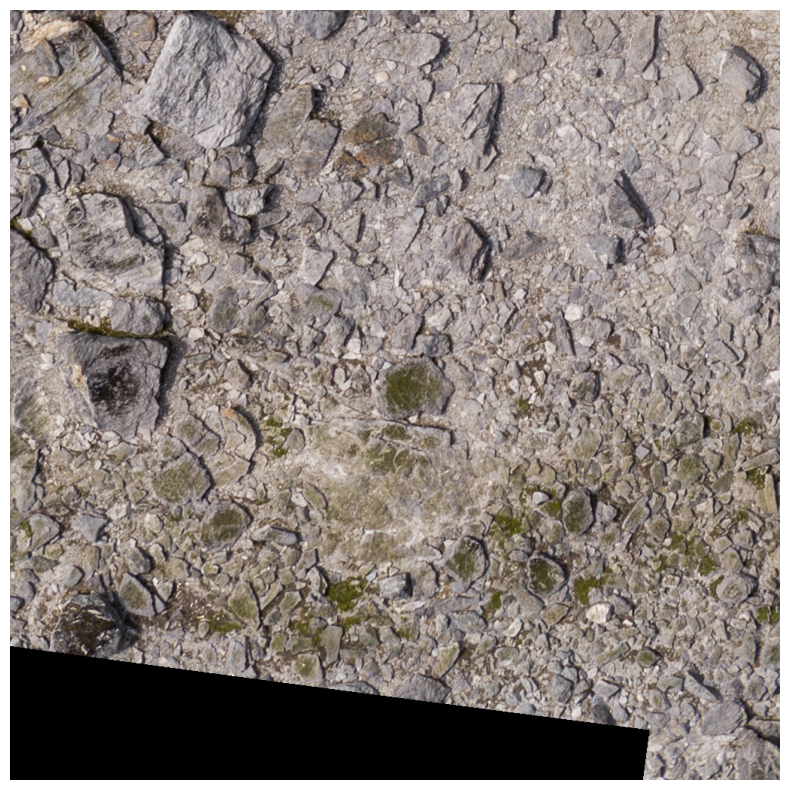

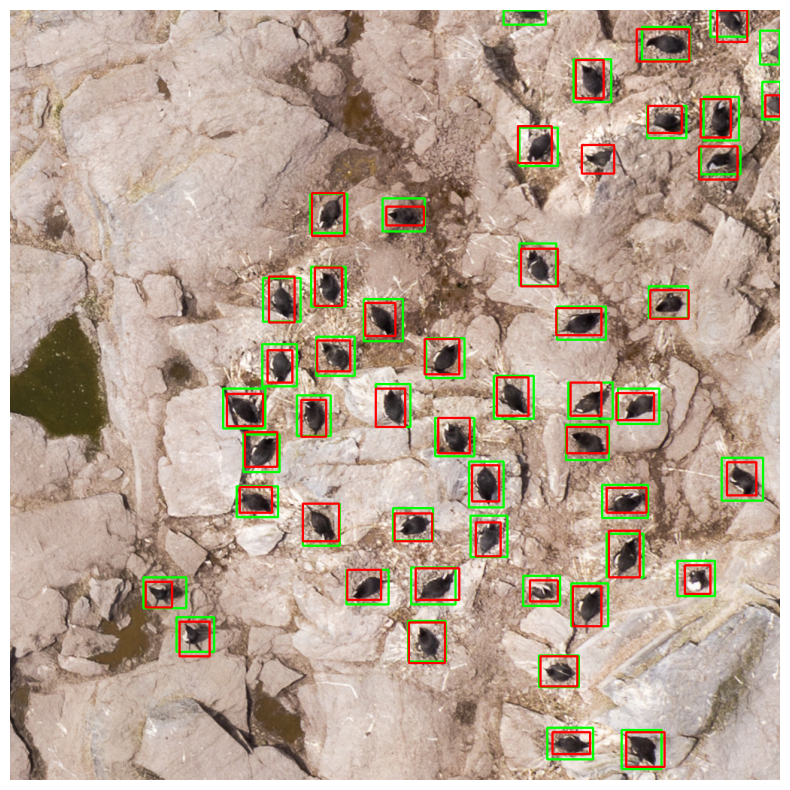

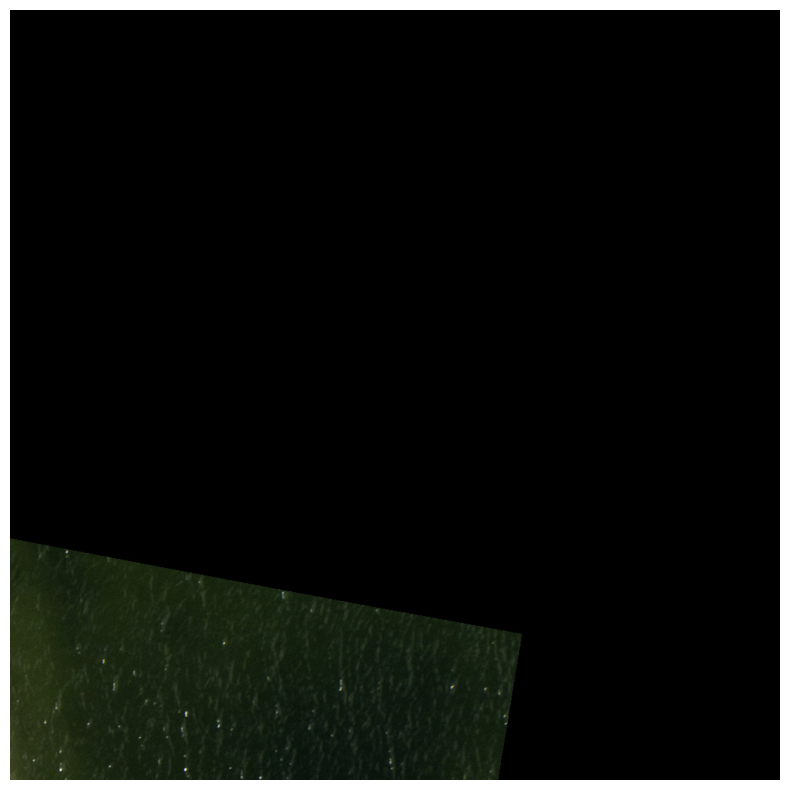

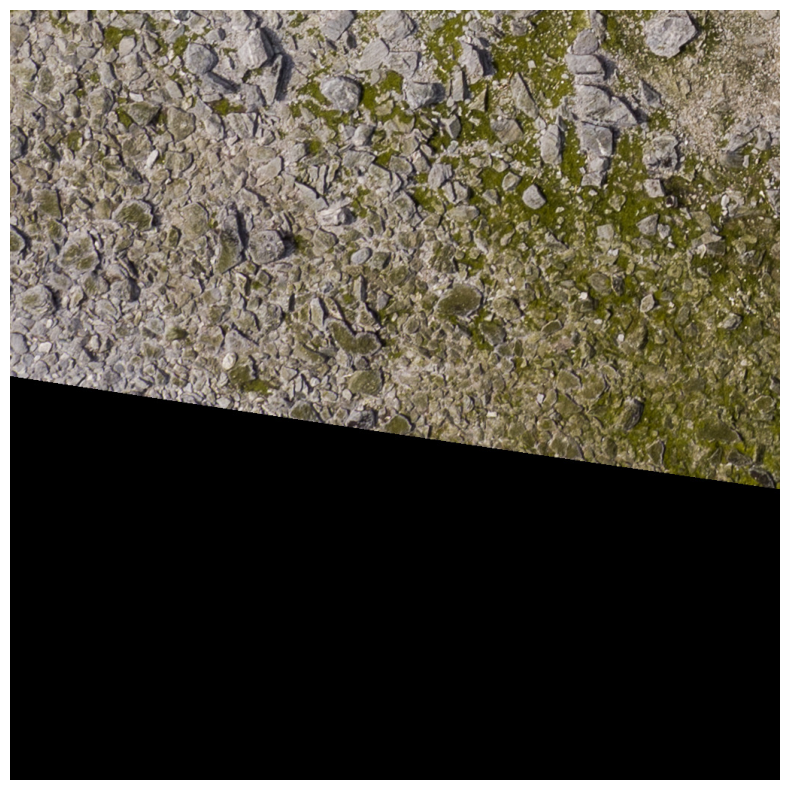

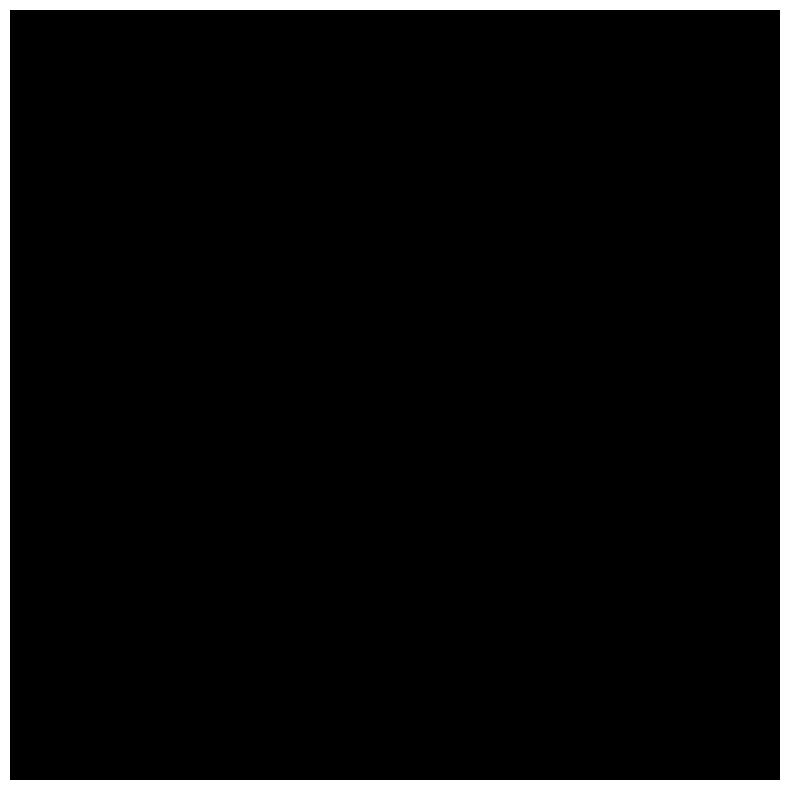

...

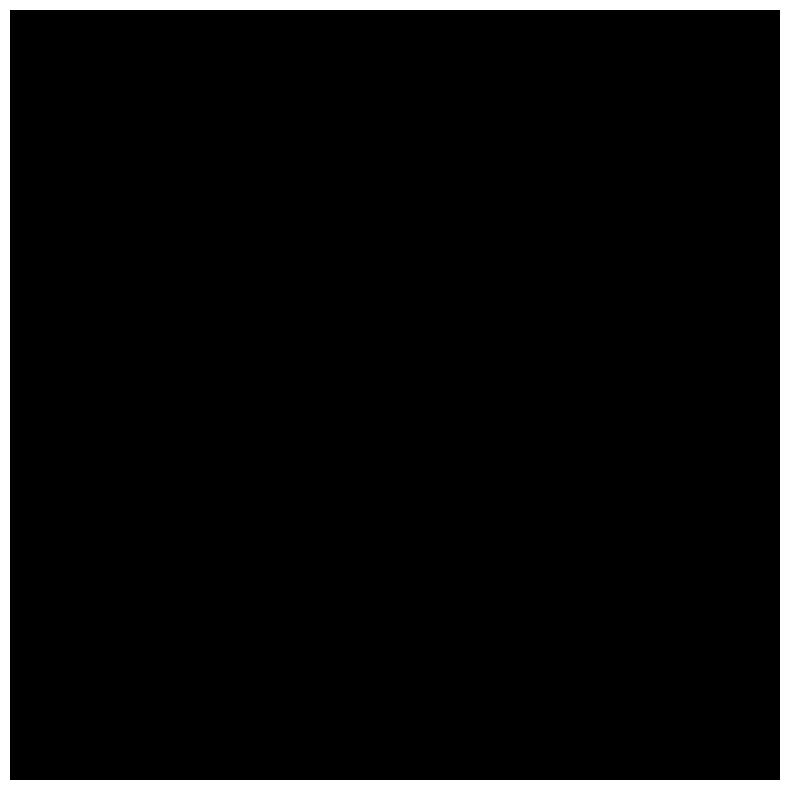

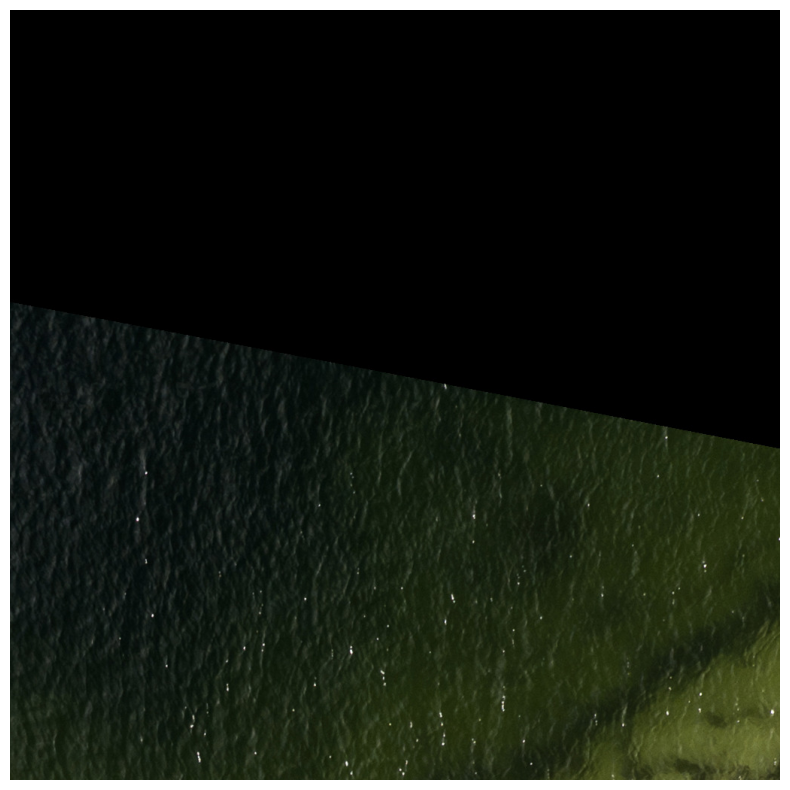

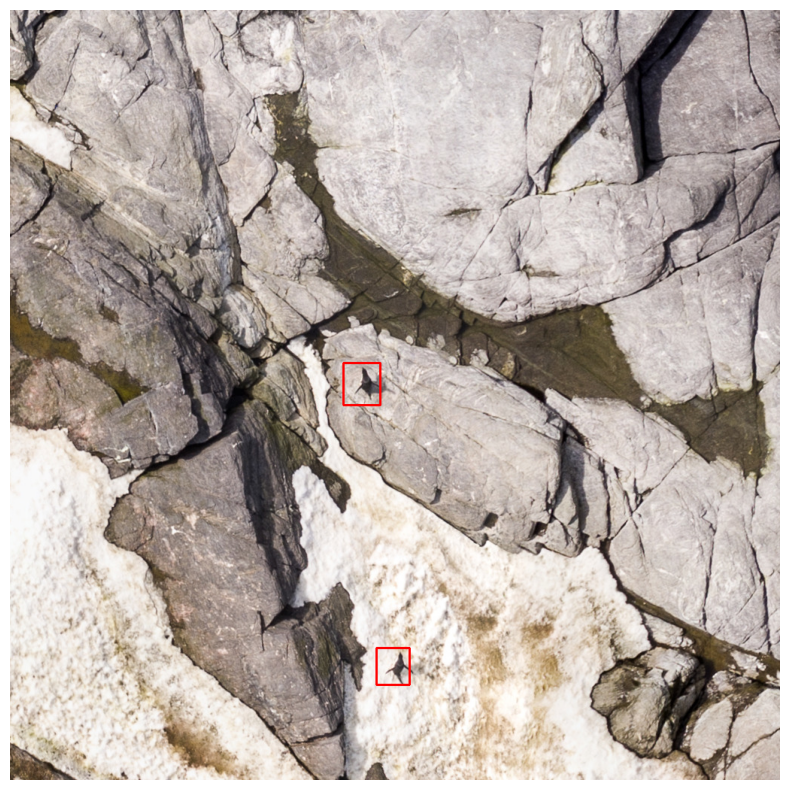

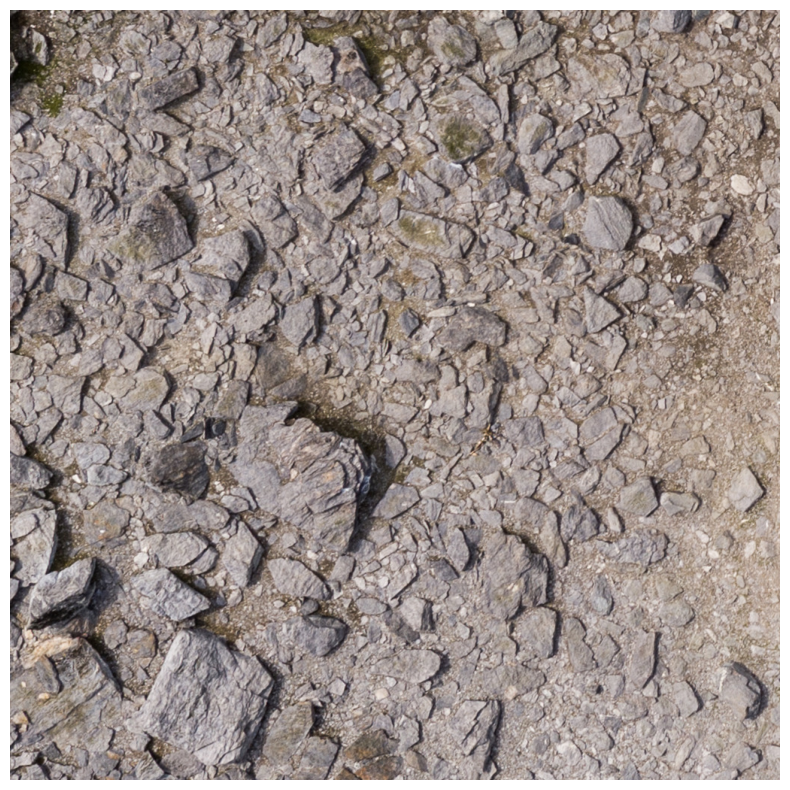

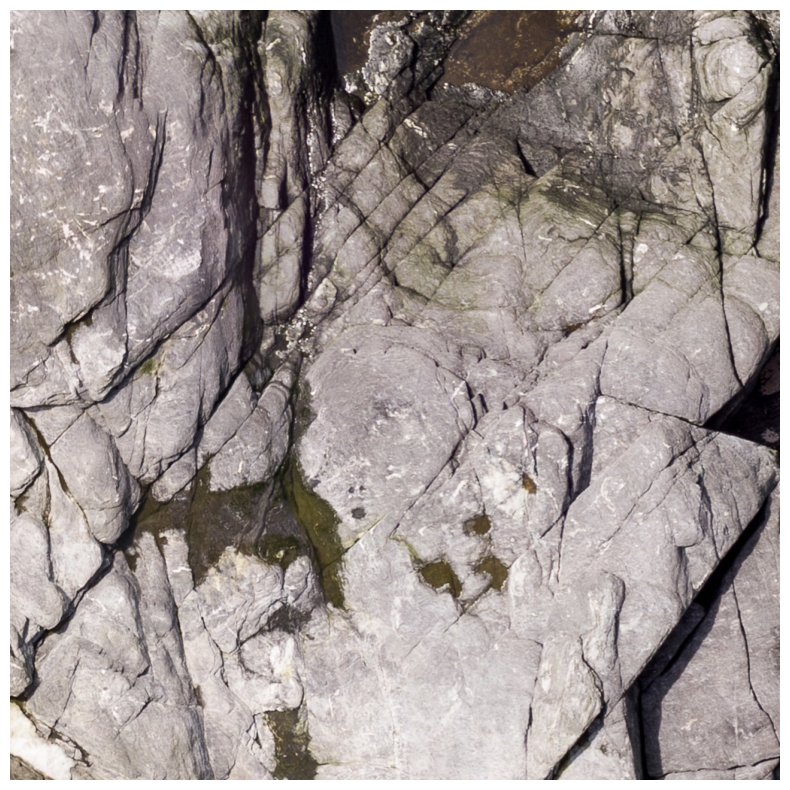

In [4]:
labels_dir = "data/uk__test_stitch/labels"
num_examples = min(len(preds), 20)

for i in range(num_examples):

    result = preds[i]
    img_path = paths[i]

    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    h, w = img.shape[:2]

    for box in result.xyxy:
        x1, y1, x2, y2 = map(int, box)
        cv2.rectangle(img,(x1,y1),(x2,y2),(0,255,0),2)

    label_file = os.path.join(
        labels_dir,
        os.path.basename(img_path).replace(".png",".txt")
    )

    if os.path.exists(label_file):
        with open(label_file) as f:
            for line in f:
                cls, xc, yc, bw, bh = map(float, line.split())

                x1 = int((xc - bw/2)*w)
                y1 = int((yc - bh/2)*h)
                x2 = int((xc + bw/2)*w)
                y2 = int((yc + bh/2)*h)

                cv2.rectangle(img,(x1,y1),(x2,y2),(255,0,0),2)

    plt.figure(figsize=(10,10))
    plt.imshow(img)
    plt.axis("off")